In [63]:
# Tratamiento de datos
# ==============================================================================
import numpy as np
import pandas as pd
from tabulate import tabulate

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import matplotlib.ticker as ticker
import seaborn as sns

# Preprocesado y modelado
# ==============================================================================
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import make_blobs
from sklearn.metrics import euclidean_distances
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression 

from skopt.space import Real, Integer
from skopt.utils import use_named_args
from skopt import gp_minimize
from skopt.plots import plot_convergence

# Varios
# ==============================================================================
import multiprocessing
import random
from itertools import product
from scipy import stats
from fitter import Fitter, get_common_distributions

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import make_column_selector
from sklearn.metrics import log_loss
from sklearn.neighbors import KNeighborsRegressor

In [32]:
# Configuración matplotlib
# ==============================================================================
plt.rcParams['image.cmap'] = "bwr"
#plt.rcParams['figure.dpi'] = "100"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

In [33]:
url_train = 'https://raw.githubusercontent.com/SantiagoTadini/TP2-Datos/main/Features/data_train.csv'
url_test = 'https://raw.githubusercontent.com/SantiagoTadini/TP2-Datos/main/Features/data_test.csv'
url_test_kaggle = 'https://raw.githubusercontent.com/SantiagoTadini/TP2-Datos/main/Features/data_test_kaggle.csv'

data_train = pd.read_csv(url_train) #se usa para entrenar el modelo
data_test = pd.read_csv(url_test) #se usa para predecir
data_test_kaggle = pd.read_csv(url_test_kaggle) #se usa para predecir

In [34]:
data_train.dtypes

ID                                    float64
Region                                float64
Territory                             float64
Pricing, Delivery_Terms_Quote_Appr    float64
Pricing, Delivery_Terms_Approved      float64
                                       ...   
Exitos_por_producto_anio              float64
Exitos_por_persona_mes                float64
Exitos_por_persona_anio               float64
Aprobacion_por_Region                 float64
Target                                float64
Length: 62, dtype: object

In [35]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13505 entries, 0 to 13504
Data columns (total 62 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   ID                                              13505 non-null  float64
 1   Region                                          13505 non-null  float64
 2   Territory                                       13505 non-null  float64
 3   Pricing, Delivery_Terms_Quote_Appr              13505 non-null  float64
 4   Pricing, Delivery_Terms_Approved                13505 non-null  float64
 5   Bureaucratic_Code_0_Approval                    13505 non-null  float64
 6   Bureaucratic_Code_0_Approved                    13505 non-null  float64
 7   Bureaucratic_Code                               13505 non-null  float64
 8   Account_Created_Date                            13505 non-null  float64
 9   Source                                 

In [36]:
# Dimensiones del dataset
# ==============================================================================
data_train.shape

(13505, 62)

In [37]:
# Número de datos ausentes por variable
# ==============================================================================
data_train.isna().sum().sort_values()

ID                             0
ASP_(converted_USD)            0
Planned_Delivery_Start_Date    0
Planned_Delivery_End_Date      0
Month                          0
                              ..
Quote_Expiry_Date              0
Last_Modified_Date             0
Last_Modified_By               0
Account_Type                   0
Target                         0
Length: 62, dtype: int64

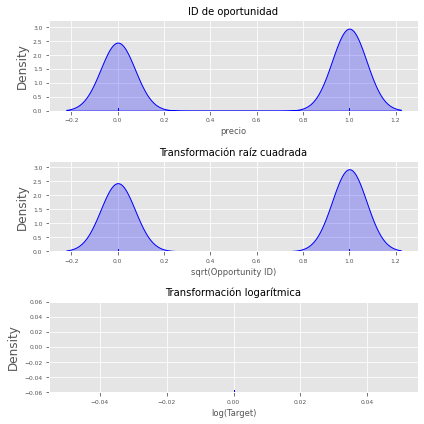

In [38]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(6, 6))
sns.distplot(
    data_train.Target,
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[0]
)
axes[0].set_title("ID de oportunidad", fontsize = 'medium')
axes[0].set_xlabel('precio', fontsize='small') 
axes[0].tick_params(labelsize = 6)

sns.distplot(
    np.sqrt(data_train.Target),
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[1]
)
axes[1].set_title("Transformación raíz cuadrada", fontsize = 'medium')
axes[1].set_xlabel('sqrt(Opportunity ID)', fontsize='small') 
axes[1].tick_params(labelsize = 6)

sns.distplot(
    np.log(data_train.Target),
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[2]
)
axes[2].set_title("Transformación logarítmica", fontsize = 'medium')
axes[2].set_xlabel('log(Target)', fontsize='small') 
axes[2].tick_params(labelsize = 6)

fig.tight_layout()

In [39]:
# Reparto de datos en train y test
# ==============================================================================
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
                                        data_train.drop('Target', axis='columns'),
                                        data_train['Target'],
                                        train_size   = 0.8,
                                        random_state = 0,
                                        shuffle      = True
                                        )

In [40]:
X_train

,ID,Region,Territory,"Pricing, Delivery_Terms_Quote_Appr","Pricing, Delivery_Terms_Approved",Bureaucratic_Code_0_Approval,Bureaucratic_Code_0_Approved,Bureaucratic_Code,Account_Created_Date,Source,...,Mean_Account_Product,Mean_Account_Product_Bureaucratic_LastModified,Account_Por_Expiry,Account_Por_TotalAmount,ASP_por_USD,Exitos_por_producto_mes,Exitos_por_producto_anio,Exitos_por_persona_mes,Exitos_por_persona_anio,Aprobacion_por_Region
3970,10766.0,0.525322,0.529954,1.0,1.0,1.0,1.0,0.656989,736222.0,0.629075,...,0.400641,0.429785,0.000000,0.000000,3.868572e+04,9.615385,92.948718,0.000000,0.000000,0.000000
7691,10461.0,0.408091,0.565700,0.0,0.0,0.0,0.0,0.656989,736403.0,0.555541,...,0.545045,0.601890,0.583333,21070.000000,1.553160e+04,5.574324,54.729730,1.166667,5.833333,0.000000
2694,25237.0,0.655876,0.582124,1.0,0.0,1.0,0.0,0.215304,735708.0,0.555541,...,0.342029,0.389960,0.466667,78902.040000,3.139315e+07,0.652174,9.130435,63.000000,701.866667,-0.655876
5338,17468.0,0.573622,0.612004,1.0,0.0,1.0,0.0,0.215304,735144.0,0.555541,...,0.879490,0.621348,683629.107527,70350.062724,4.092255e+04,39.871854,321.466819,9.283154,149.458781,-0.573622
6808,8738.0,0.573622,0.612004,1.0,0.0,1.0,0.0,0.215304,736173.0,0.555541,...,0.000000,0.107747,0.000000,0.000000,7.706532e+06,0.000000,0.000000,0.000000,0.000000,-0.573622
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13123,14731.0,0.573622,0.440299,1.0,0.0,1.0,0.0,0.215304,735076.0,0.555541,...,0.247059,0.301948,0.000000,0.000000,2.829750e+04,5.435294,63.741176,0.000000,0.000000,-0.573622
3264,25792.0,0.655876,0.582124,1.0,1.0,0.0,0.0,0.656989,735708.0,0.555541,...,0.614206,0.636470,343546.466667,79.632000,-5.362801e+06,5.332215,105.882550,17.266667,701.866667,0.000000
9845,7451.0,0.408091,0.565700,1.0,1.0,1.0,1.0,0.656989,736550.0,0.435945,...,0.051724,0.355229,0.000000,0.000000,8.819016e+05,0.310345,2.586207,0.000000,0.000000,0.000000
10799,21549.0,0.655876,0.819672,0.0,0.0,0.0,0.0,0.656989,735134.0,0.778452,...,0.762868,0.710801,661553.098077,33101.534769,1.842912e+06,8.159574,106.702128,20.655769,222.723077,0.000000


In [41]:
y_train

3970     0.0
7691     0.0
2694     0.0
5338     1.0
6808     0.0
        ... 
13123    0.0
3264     1.0
9845     0.0
10799    1.0
2732     0.0
Name: Target, Length: 10804, dtype: float64

In [42]:
print("Partición de entrenamento")
print("-----------------------")
print(y_train.describe())

Partición de entrenamento
-----------------------
count    10804.000000
mean         0.546464
std          0.497859
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: Target, dtype: float64


In [43]:
print("Partición de test")
print("-----------------------")
print(y_test.describe())

Partición de test
-----------------------
count    2701.000000
mean        0.546464
std         0.497929
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: Target, dtype: float64


In [44]:
# Selección de las variables por típo
# ==============================================================================
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import make_column_selector

# Se estandarizan las columnas numéricas y se hace one-hot-encoding de las 
# columnas cualitativas. Para mantener las columnas a las que no se les aplica 
# ninguna transformación se tiene que indicar remainder='passthrough'.
numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns.to_list()
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.to_list()

preprocessor = ColumnTransformer(
                   [('scale', StandardScaler(), numeric_cols),
                    ('onehot', OneHotEncoder(handle_unknown='ignore'), cat_cols)])

In [45]:
X_train_prep = preprocessor.fit_transform(X_train)
X_test_prep  = preprocessor.transform(X_test)

In [46]:
# Convertir el output en dataframe y añadir el nombre de las columnas
# ==============================================================================
#encoded_cat = preprocessor.named_transformers_['onehot'].get_feature_names(cat_cols)
labels = np.concatenate([numeric_cols])
datos_train_prep = preprocessor.transform(X_train)
datos_train_prep = pd.DataFrame(datos_train_prep,columns=labels)
datos_train_prep.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10804 entries, 0 to 10803
Data columns (total 61 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   ID                                              10804 non-null  float64
 1   Region                                          10804 non-null  float64
 2   Territory                                       10804 non-null  float64
 3   Pricing, Delivery_Terms_Quote_Appr              10804 non-null  float64
 4   Pricing, Delivery_Terms_Approved                10804 non-null  float64
 5   Bureaucratic_Code_0_Approval                    10804 non-null  float64
 6   Bureaucratic_Code_0_Approved                    10804 non-null  float64
 7   Bureaucratic_Code                               10804 non-null  float64
 8   Account_Created_Date                            10804 non-null  float64
 9   Source                                 

In [47]:
from sklearn.linear_model import Ridge

# Preprocedado
# ==============================================================================

# Identificación de columnas numéricas y categóricas
numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns.to_list()
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.to_list()


# Transformaciones para las variables numéricas
numeric_transformer = Pipeline(
                        steps=[('scaler', StandardScaler())]
                      )

# Transformaciones para las variables categóricas
categorical_transformer = Pipeline(
                            steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))]
                          )

preprocessor = ColumnTransformer(
                    transformers=[
                        ('numeric', numeric_transformer, numeric_cols),
                        ('cat', categorical_transformer, cat_cols)
                    ],
                    remainder='passthrough'
                )

# Pipeline
# ==============================================================================

# Se combinan los pasos de preprocesado y el modelo en un mismo pipeline
pipe = Pipeline([('preprocessing', preprocessor),
                 ('modelo', Ridge())])

# Train
# ==============================================================================
# Se asigna el resultado a _ para que no se imprima por pantalla
_ = pipe.fit(X=X_train, y=y_train)

In [48]:
# Validación cruzada
# ==============================================================================
from sklearn.model_selection import cross_val_score

cv_scores = cross_val_score(
                estimator = pipe,
                X         = X_train,
                y         = y_train,
                scoring   = 'neg_root_mean_squared_error',
                cv        = 5
             )

print(f"Métricas validación cruzada: {cv_scores}")
print(f"Média métricas de validación cruzada: {cv_scores.mean()}")

Métricas validación cruzada: [-2.38250601 -0.31885282 -0.31722286 -0.32137521 -0.32328225]
Média métricas de validación cruzada: -0.7326478275190587


In [49]:
# Validación cruzada repetida
# ==============================================================================
from sklearn.model_selection import RepeatedKFold

cv = RepeatedKFold(n_splits=5, n_repeats=5, random_state=123)
cv_scores = cross_val_score(
                estimator = pipe,
                X         = X_train,
                y         = y_train,
                scoring   = 'neg_root_mean_squared_error',
                cv        = cv
             )

print(f"Métricas de validación cruzada: {cv_scores}")
print("")
print(f"Média métricas de validación cruzada: {cv_scores.mean()}")

Métricas de validación cruzada: [-0.32407685 -1.8842587  -0.31147357 -0.31425548 -0.32509458 -0.30989505
 -0.32204707 -1.69937502 -0.31715744 -0.32333536 -0.3257972  -0.32527507
 -0.31566447 -0.31516475 -1.77146143 -1.99647763 -0.31906221 -0.32447771
 -0.32234301 -0.31571677 -0.32185148 -0.31660789 -0.3258061  -1.97102829
 -0.31298608]

Média métricas de validación cruzada: -0.6284275686895943


In [50]:
# Validación cruzada repetida con múltiples métricas
# ==============================================================================
from sklearn.model_selection import cross_validate

cv = RepeatedKFold(n_splits=3, n_repeats=5, random_state=123)
cv_scores = cross_validate(
                estimator = pipe,
                X         = X_train,
                y         = y_train,
                scoring   = ('r2', 'neg_root_mean_squared_error'),
                cv        = cv,
                return_train_score = True
            )

# Se convierte el diccionario a dataframe para facilitar la visualización
cv_scores = pd.DataFrame(cv_scores)
cv_scores

,fit_time,score_time,test_r2,train_r2,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,0.059001,0.008999,0.580775,0.595521,-0.322598,-0.316479
1,0.039996,0.007001,-8.108214,0.593695,-1.499885,-0.317569
2,0.032999,0.009000,0.586664,0.595046,-0.320286,-0.316687
3,0.036000,0.012000,0.602789,0.586444,-0.313877,-0.320088
4,0.049001,0.010000,-5.444886,0.602710,-1.264411,-0.313718
5,0.046999,0.010000,0.588241,0.594601,-0.319172,-0.317107
6,0.063056,0.009942,0.568674,0.604000,-0.327206,-0.313153
7,0.037998,0.010002,0.594768,0.590308,-0.316876,-0.318669
8,0.044999,0.008000,-7.520689,0.589940,-1.452158,-0.318901
9,0.041998,0.008999,-7.312413,0.589770,-1.434974,-0.318898


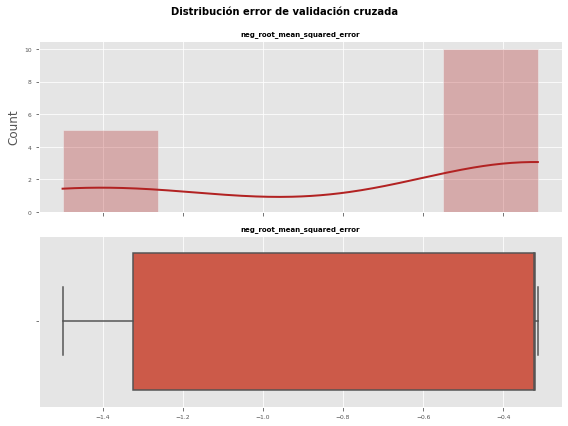

In [51]:
# Distribución del error de validación cruzada
# ==============================================================================
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(8, 6), sharex=True)

sns.histplot(
    data    = cv_scores['test_neg_root_mean_squared_error'],
    stat    = "count",
    kde     = True,
    line_kws= {'linewidth': 2},
    color   = "firebrick",
    alpha   = 0.3,
    ax      = axes[0]
)

axes[0].set_title('neg_root_mean_squared_error', fontsize = 7, fontweight = "bold")
axes[0].tick_params(labelsize = 6)
axes[0].set_xlabel("")
    
sns.boxplot(
    cv_scores['test_neg_root_mean_squared_error'],
    ax      = axes[1]
)
axes[1].set_title('neg_root_mean_squared_error', fontsize = 7, fontweight = "bold")
axes[1].tick_params(labelsize = 6)
axes[1].set_xlabel("")


fig.tight_layout()
plt.subplots_adjust(top=0.9)
fig.suptitle('Distribución error de validación cruzada', fontsize = 10,
             fontweight = "bold");

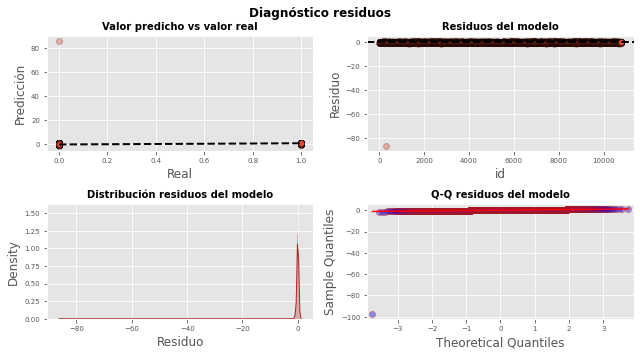

In [52]:
# Diagnóstico errores (residuos) de las predicciones de validación cruzada
# ==============================================================================
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
import statsmodels.api as sm

# Validación cruzada
# ==============================================================================
cv = KFold(n_splits=5, random_state=123, shuffle=True)
cv_prediccones = cross_val_predict(
                    estimator = pipe,
                    X         = X_train,
                    y         = y_train,
                    cv        = cv
                  )

# Gráficos
# ==============================================================================
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9, 5))

axes[0, 0].scatter(y_train, cv_prediccones, edgecolors=(0, 0, 0), alpha = 0.4)
axes[0, 0].plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()],
                'k--', color = 'black', lw=2)
axes[0, 0].set_title('Valor predicho vs valor real', fontsize = 10, fontweight = "bold")
axes[0, 0].set_xlabel('Real')
axes[0, 0].set_ylabel('Predicción')
axes[0, 0].tick_params(labelsize = 7)

axes[0, 1].scatter(list(range(len(y_train))), y_train - cv_prediccones,
                   edgecolors=(0, 0, 0), alpha = 0.4)
axes[0, 1].axhline(y = 0, linestyle = '--', color = 'black', lw=2)
axes[0, 1].set_title('Residuos del modelo', fontsize = 10, fontweight = "bold")
axes[0, 1].set_xlabel('id')
axes[0, 1].set_ylabel('Residuo')
axes[0, 1].tick_params(labelsize = 7)

sns.histplot(
    data    = y_train - cv_prediccones,
    stat    = "density",
    kde     = True,
    line_kws= {'linewidth': 1},
    color   = "firebrick",
    alpha   = 0.3,
    ax      = axes[1, 0]
)

axes[1, 0].set_title('Distribución residuos del modelo', fontsize = 10,
                     fontweight = "bold")
axes[1, 0].set_xlabel("Residuo")
axes[1, 0].tick_params(labelsize = 7)


sm.qqplot(
    y_train - cv_prediccones,
    fit   = True,
    line  = 'q',
    ax    = axes[1, 1], 
    color = 'firebrick',
    alpha = 0.4,
    lw    = 2
)
axes[1, 1].set_title('Q-Q residuos del modelo', fontsize = 10, fontweight = "bold")
axes[1, 1].tick_params(labelsize = 7)

fig.tight_layout()
plt.subplots_adjust(top=0.9)
fig.suptitle('Diagnóstico residuos', fontsize = 12, fontweight = "bold");

In [53]:
predicciones = pipe.predict(X_test)
# Se crea un dataframe con las predicciones y el valor real
df_predicciones = pd.DataFrame({'Target' : y_test, 'prediccion' : predicciones})
df_predicciones

,Target,prediccion
521,0.0,0.085363
10574,0.0,0.622121
2128,0.0,0.346950
5573,1.0,0.885138
9828,1.0,1.048778
...,...,...
8265,1.0,0.631719
1235,1.0,0.732133
8387,1.0,0.865045
839,1.0,0.672833


In [54]:
from sklearn.model_selection import GridSearchCV, RepeatedKFold
from sklearn.linear_model import Ridge

# Pipe: preprocesado + modelo
# ==============================================================================
# Identificación de columnas numéricas y catégoricas
numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns.to_list()
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.to_list()


# Transformaciones para las variables numéricas
numeric_transformer = Pipeline(
                        steps=[('scaler', StandardScaler())]
                      )

# Transformaciones para las variables categóricas
categorical_transformer = Pipeline(
                            steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))]
                          )

preprocessor = ColumnTransformer(
                    transformers=[
                        ('numeric', numeric_transformer, numeric_cols),
                        ('cat', categorical_transformer, cat_cols)
                    ],
                    remainder='passthrough'
                )

# Se combinan los pasos de preprocesado y el modelo en un mismo pipeline
pipe = Pipeline([('preprocessing', preprocessor),
                 ('modelo', Ridge())])

# Grid de hiperparámetros
# ==============================================================================
param_grid = {'modelo__alpha': np.logspace(-5, 3, 10)}

# Búsqueda por validación cruzada
# ==============================================================================
grid = GridSearchCV(
        estimator  = pipe,
        param_grid = param_grid,
        scoring    = 'neg_root_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits = 5, n_repeats = 3), 
        verbose    = 0,
        return_train_score = True
        )

# Se asigna el resultado a _ para que no se imprima por pantalla
_= grid.fit(X = X_train, y = y_train)

In [55]:
# Resultados del grid
# ==============================================================================
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)')\
    .drop(columns = 'params')\
    .sort_values('mean_test_score', ascending = False)

,param_modelo__alpha,mean_test_score,std_test_score,mean_train_score,std_train_score
9,1000,-0.340025,0.031783,-0.322742,0.000816
8,129.155,-0.465635,0.290200,-0.318698,0.000761
7,16.681,-0.573758,0.508644,-0.317359,0.000741
6,2.15443,-0.601890,0.565035,-0.317213,0.000736
5,0.278256,-0.605945,0.573119,-0.317206,0.000736
4,0.0359381,-0.606451,0.574128,-0.317201,0.000736
0,1e-05,-0.606487,0.574195,-0.317197,0.000736
1,7.74264e-05,-0.606487,0.574196,-0.317197,0.000736
2,0.000599484,-0.606489,0.574201,-0.317197,0.000736
3,0.00464159,-0.606498,0.574222,-0.317197,0.000736


In [56]:
# Mejores hiperparámetros
# ==============================================================================
print("-----------------------------------")
print("Mejores hiperparámetros encontrados")
print("-----------------------------------")
print(grid.best_params_, ":", grid.best_score_, grid.scoring)

-----------------------------------
Mejores hiperparámetros encontrados
-----------------------------------
{'modelo__alpha': 1000.0} : -0.34002544829550446 neg_root_mean_squared_error


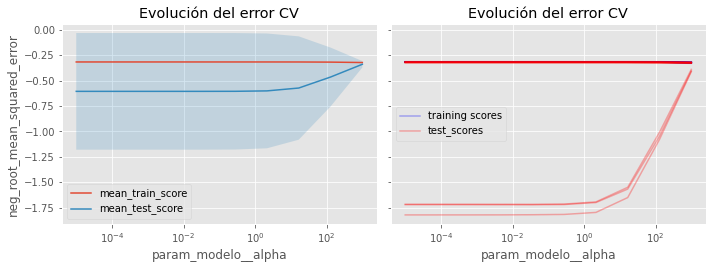

In [57]:
# Gráfico resultados validación cruzada para cada hiperparámetro
# ==============================================================================
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 3.84), sharey=True)

# Gráfico 1
# ------------------------------------------------------------------------------
resultados.plot('param_modelo__alpha', 'mean_train_score', ax=axes[0])
resultados.plot('param_modelo__alpha', 'mean_test_score', ax=axes[0])
axes[0].fill_between(resultados.param_modelo__alpha.astype(np.float),
                resultados['mean_train_score'] + resultados['std_train_score'],
                resultados['mean_train_score'] - resultados['std_train_score'],
                alpha=0.2)
axes[0].fill_between(resultados.param_modelo__alpha.astype(np.float),
                resultados['mean_test_score'] + resultados['std_test_score'],
                resultados['mean_test_score'] - resultados['std_test_score'],
                alpha=0.2)
axes[0].legend()
axes[0].set_xscale('log')
axes[0].set_title('Evolución del error CV')
axes[0].set_ylabel('neg_root_mean_squared_error');

# Gráfico 2
# ------------------------------------------------------------------------------
numero_splits = grid.n_splits_

resultados.plot(
    x     = 'param_modelo__alpha',
    y     = [f'split{i}_train_score' for i in range(numero_splits)],
    alpha = 0.3,
    c     = 'blue', 
    ax    = axes[1]
)

resultados.plot(
    x     = 'param_modelo__alpha',
    y     = [f'split{i}_test_score' for i in range(numero_splits)],
    alpha = 0.3,
    c     = 'red', 
    ax    = axes[1]
)

axes[1].legend(
    (axes[1].get_children()[0], axes[1].get_children()[numero_splits]),
    ('training scores', 'test_scores')
)
axes[1].set_xscale('log')
axes[1].set_title('Evolución del error CV')
axes[1].set_ylabel('neg_root_mean_squared_error');

fig.tight_layout()

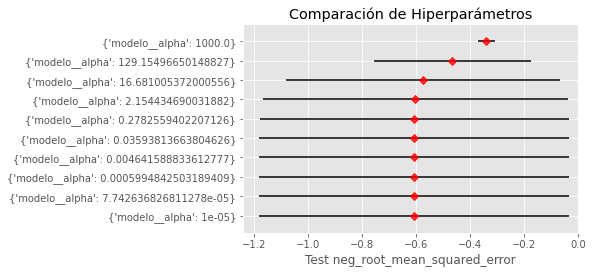

In [58]:
fig, ax = plt.subplots(figsize=(6, 3.84))
ax.barh(
    [str(d) for d in resultados['params']],
    resultados['mean_test_score'],
    xerr=resultados['std_test_score'],
    align='center',
    alpha=0
)
ax.plot(
    resultados['mean_test_score'],
    [str(d) for d in resultados['params']],
    marker="D",
    linestyle="",
    alpha=0.8,
    color="r"
)
ax.set_title('Comparación de Hiperparámetros')
ax.set_xlabel('Test neg_root_mean_squared_error');

In [59]:
#Planteo nuevamente el modelo de KNN

In [64]:
knn = KNeighborsRegressor(n_neighbors=11,weights= 'distance',algorithm='ball_tree',leaf_size=63, metric='chebyshev')
knn.fit(X_train, y_train)

KNeighborsRegressor(algorithm='ball_tree', leaf_size=63, metric='chebyshev',
                    n_neighbors=11, weights='distance')

In [65]:
y_pred = knn.predict(X_test)

In [66]:
y_pred

array([0.        , 0.4923474 , 0.        , ..., 1.        , 0.437021  ,
       0.60406428])

In [67]:
#armamos csv con la prediccion
oporTest = X_test['Opportunity_ID']
oporTest = oporTest.to_frame()
predicTest = y_test.to_frame()
oporTest['Target'] = predicTest
agrupTest = oporTest.groupby('Opportunity_ID').agg({'Target':'mean'}).reset_index()

In [68]:
# Sacamos el preds_agrupado_por_opp
oportunidades_test_de_practica = X_test['Opportunity_ID']
oportunidades_test_de_practica = oportunidades_test_de_practica.to_frame()

oportunidades_test_de_practica['Target'] = y_pred

preds_agrupado_por_opp = oportunidades_test_de_practica.groupby('Opportunity_ID').agg({'Target':'mean'})
preds_agrupado_por_opp = preds_agrupado_por_opp.reset_index()

In [69]:
y_predict_kaggle =knn.predict(data_test_kaggle)

In [70]:
oportunidades_test_kaggle = data_test_kaggle['Opportunity_ID']
oportunidades_test_kaggle = oportunidades_test_kaggle.to_frame()

oportunidades_test_kaggle['Target'] = y_predict_kaggle

preds_testKaggle_agrupado_por_opp = oportunidades_test_kaggle.groupby('Opportunity_ID').agg({'Target' : 'mean'})
preds_testKaggle_agrupado_por_opp = preds_testKaggle_agrupado_por_opp.reset_index()
preds_testKaggle_agrupado_por_opp['Opportunity_ID']= preds_testKaggle_agrupado_por_opp['Opportunity_ID'].astype(np.int64)
preds_testKaggle_agrupado_por_opp

,Opportunity_ID,Target
0,10689,0.864586
1,10690,0.984277
2,10691,1.000000
3,10692,0.019667
4,10693,0.454664
...,...,...
1562,12364,0.706059
1563,12365,0.723154
1564,12366,0.628994
1565,12367,0.653923


In [71]:
# Calculamos el error con groupby hecho
error = log_loss(agrupTest['Target'], np.nan_to_num(preds_agrupado_por_opp['Target'].to_numpy()))
error

0.5592485617399309

In [72]:
preds_testKaggle_agrupado_por_opp.to_csv('preds_testKNN.csv', index=False, header=True)

In [79]:
# Otro optimizador:
# fmin: class which will host optimization process
# tpe: the optimizer to be used (Tree of Parzen Estimator)
# hp: for defining the search space
from hyperopt import STATUS_OK
from hyperopt import fmin, tpe, hp
from hyperopt.pyll.base import scope 

def objective(x):
    model = KNeighborsRegressor(n_neighbors=x['vecinos'],weights= 'distance',algorithm='kd_tree',leaf_size=x['max_leaf_size'], metric='manhattan').fit(X_train, y_train)
    logloss = log_loss(y_test, model.predict(X_test))
    # print(logloss)
    return {
        'loss': logloss,
        'status': STATUS_OK
    }

# Search space definition
# space = hp.uniform('x', -2, 2)
space = {'vecinos' : scope.int(hp.uniform('vecinos',1,200)),
         'max_leaf_size' : scope.int(hp.uniform('max_leaf_nodes',1,100)),
        }

# Init the optimizer
# fn: function to be optimized
# space: search space
# algo: optimizer algorithm
# max_evals: number of iterations
best = fmin(
    fn=objective,  
    space=space,
    algo=tpe.suggest,
    max_evals=500
)

print(f"Optimal value of x: {best}")

100%|██████████| 500/500 [05:26<00:00,  1.53trial/s, best loss: 0.26119254852471274]
Optimal value of x: {'max_leaf_nodes': 56.71941190139649, 'vecinos': 69.9119838669619}


In [81]:
knn = KNeighborsRegressor(n_neighbors=69,weights= 'distance',algorithm='ball_tree',leaf_size=56, metric='chebyshev')
knn.fit(X_train, y_train)

KNeighborsRegressor(algorithm='ball_tree', leaf_size=56, metric='chebyshev',
                    n_neighbors=69, weights='distance')

In [82]:
y_predOpti = knn.predict(X_test)

In [83]:
#armamos csv con la prediccion
oporTestOpti = X_test['Opportunity_ID']
oporTestOpti = oporTestOpti.to_frame()
predicTestOpti = y_test.to_frame()
oporTestOpti['Target'] = predicTestOpti
agrupTestOpti = oporTestOpti.groupby('Opportunity_ID').agg({'Target':'mean'}).reset_index()

In [84]:
# Sacamos el preds_agrupado_por_opp
oportunidades_test_de_practicaOpti = X_test['Opportunity_ID']
oportunidades_test_de_practicaOpti = oportunidades_test_de_practicaOpti.to_frame()

oportunidades_test_de_practicaOpti['Target'] = y_predOpti

preds_agrupado_por_oppOpti = oportunidades_test_de_practicaOpti.groupby('Opportunity_ID').agg({'Target':'mean'})
preds_agrupado_por_oppOpti = preds_agrupado_por_oppOpti.reset_index()

In [85]:
# Calculamos el error con groupby hecho
error = log_loss(agrupTestOpti['Target'], np.nan_to_num(preds_agrupado_por_oppOpti['Target'].to_numpy()))
error

0.29605997392954886

In [86]:
y_predict_kaggleOpti =knn.predict(data_test_kaggle)

In [87]:
oportunidades_test_kaggleOpti = data_test_kaggle['Opportunity_ID']
oportunidades_test_kaggleOpti = oportunidades_test_kaggleOpti.to_frame()

oportunidades_test_kaggleOpti['Target'] = y_predict_kaggleOpti

preds_testKaggle_agrupado_por_oppOpti = oportunidades_test_kaggleOpti.groupby('Opportunity_ID').agg({'Target' : 'mean'})
preds_testKaggle_agrupado_por_oppOpti = preds_testKaggle_agrupado_por_oppOpti.reset_index()
preds_testKaggle_agrupado_por_oppOpti['Opportunity_ID']= preds_testKaggle_agrupado_por_oppOpti['Opportunity_ID'].astype(np.int64)
preds_testKaggle_agrupado_por_oppOpti

,Opportunity_ID,Target
0,10689,0.858568
1,10690,0.896227
2,10691,0.914365
3,10692,0.210860
4,10693,0.719995
...,...,...
1562,12364,0.728900
1563,12365,0.768024
1564,12366,0.662096
1565,12367,0.556186


In [88]:
preds_testKaggle_agrupado_por_oppOpti.to_csv('preds_testKNNOpti.csv', index=False, header=True)

In [89]:
from sklearn.linear_model import RidgeClassifier
clf = RidgeClassifier(alpha= 1, normalize = True,solver ='sparse_cg')
clf.fit(X_train,y_train)

RidgeClassifier(alpha=1, normalize=True, solver='sparse_cg')

In [90]:
def objective(x):
    model = Ridge(alpha=x['alpha'],fit_intercept=True,copy_X=True, normalize =True, max_iter=x['max_iter'], solver='cholesky', random_state=x['random']).fit(X_train, y_train)
    logloss = log_loss(y_test, model.predict(X_test))
    # print(logloss)
    return {
        'loss': logloss,
        'status': STATUS_OK
    }

# Search space definition
# space = hp.uniform('x', -2, 2)
space = {'alpha' : scope.int(hp.normal('alpha',-100,100)),
         'max_iter' : scope.int(hp.uniform('max_iter',1,500)),
         'random' : scope.int(hp.uniform('random',1,1000))
        }

# Init the optimizer
# fn: function to be optimized
# space: search space
# algo: optimizer algorithm
# max_evals: number of iterations
best = fmin(
    fn=objective,  
    space=space,
    algo=tpe.suggest,
    max_evals=500
)

print(f"Optimal value of x: {best}")

100%|██████████| 500/500 [00:22<00:00, 22.03trial/s, best loss: 0.3789765156843458]
Optimal value of x: {'alpha': 1.0426919942930937, 'max_iter': 93.83100630646271, 'random': 350.586260236616}


In [91]:
clf = Ridge(alpha=1,fit_intercept=True, normalize =True, max_iter=93, solver='cholesky', random_state=350)
clf.fit(X_train,y_train)

Ridge(alpha=1, max_iter=93, normalize=True, random_state=350, solver='cholesky')

In [92]:
resultadosRidgePredi = clf.predict(X_test)
resultadosRidgePredi

array([0.12694016, 0.58782066, 0.45873061, ..., 0.8143324 , 0.64099847,
       0.54537283])

In [93]:
#armamos csv con la prediccion
oporTestOptiRidge = X_test['Opportunity_ID']
oporTestOptiRidge = oporTestOptiRidge.to_frame()
predicTestOptiRidge = y_test.to_frame()
oporTestOptiRidge['Target'] = predicTestOptiRidge
agrupTestOptiRidge = oporTestOptiRidge.groupby('Opportunity_ID').agg({'Target':'mean'}).reset_index()

In [94]:
# Sacamos el preds_agrupado_por_opp
oportunidades_test_de_practicaOptiRidge = X_test['Opportunity_ID']
oportunidades_test_de_practicaOptiRidge = oportunidades_test_de_practicaOptiRidge.to_frame()

oportunidades_test_de_practicaOptiRidge['Target'] = resultadosRidgePredi

preds_agrupado_por_oppOptiRidge = oportunidades_test_de_practicaOptiRidge.groupby('Opportunity_ID').agg({'Target':'mean'})
preds_agrupado_por_oppOptiRidge = preds_agrupado_por_oppOptiRidge.reset_index()

In [95]:
# Calculamos el error con groupby hecho
error = log_loss(agrupTestOptiRidge['Target'], np.nan_to_num(preds_agrupado_por_oppOptiRidge['Target'].to_numpy()))
error

0.393601321249695

In [96]:
y_predict_kaggleOpti =clf.predict(data_test_kaggle)

In [97]:
oportunidades_test_kaggleOpti['Target'] = y_predict_kaggleOpti

preds_testKaggle_agrupado_por_oppOpti = oportunidades_test_kaggleOpti.groupby('Opportunity_ID').agg({'Target' : 'mean'})
preds_testKaggle_agrupado_por_oppOpti = preds_testKaggle_agrupado_por_oppOpti.reset_index()
preds_testKaggle_agrupado_por_oppOpti['Opportunity_ID']= preds_testKaggle_agrupado_por_oppOpti['Opportunity_ID'].astype(np.int64)
preds_testKaggle_agrupado_por_oppOpti

,Opportunity_ID,Target
0,10689,0.767127
1,10690,0.710306
2,10691,0.418866
3,10692,0.403593
4,10693,0.711840
...,...,...
1562,12364,0.681232
1563,12365,0.715903
1564,12366,0.650202
1565,12367,0.720069


In [98]:
preds_testKaggle_agrupado_por_oppOpti.to_csv('preds_testRidgeOpti.csv', index=False, header=True)